## Donors Choose with Decision Tree Model

DonorsChoose.org receives hundreds of thousands of project proposals each year for classroom projects in need of funding. Right now, a large number of volunteers is needed to manually screen each submission before it's approved to be posted on the DonorsChoose.org website.

Next year, DonorsChoose.org expects to receive close to 500,000 project proposals. As a result, there are three main problems they need to solve:

How to scale current manual processes and resources to screen 500,000 projects so that they can be posted as quickly and as efficiently as possible
How to increase the consistency of project vetting across different volunteers to improve the experience for teachers
How to focus volunteer time on the applications that need the most assistance
The goal of the competition is to predict whether or not a DonorsChoose.org project proposal submitted by a teacher will be approved, using the text of project descriptions as well as additional metadata about the project, teacher, and school. DonorsChoose.org can then use this information to identify projects most likely to need further review before approval.

In [2]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

import sqlite3
import pandas as pd
import numpy as np
import nltk
import string
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from nltk.stem.porter import PorterStemmer
import missingno as msno

import re
# Tutorial about Python regular expressions: https://pymotw.com/2/re/
import string
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer

from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle

from tqdm import tqdm
import os

# from plotly import plotly
# import plotly.offline as offline
# import plotly.graph_objs as go
# offline.init_notebook_mode()
# from collections import Counter

In [3]:
# Load data

project_data = pd.read_csv('train_data.csv')
resource_data = pd.read_csv('resources.csv')

In [4]:
# View the first five rows

project_data.head()

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_subject_categories,project_subject_subcategories,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,Mrs.,IN,2016-12-05 13:43:57,Grades PreK-2,Literacy & Language,"ESL, Literacy",Educational Support for English Learners at Home,My students are English learners that are work...,"\""The limits of your language are the limits o...",NaN,NaN,My students need opportunities to practice beg...,0,0
1,140945,p258326,897464ce9ddc600bced1151f324dd63a,Mr.,FL,2016-10-25 09:22:10,Grades 6-8,"History & Civics, Health & Sports","Civics & Government, Team Sports",Wanted: Projector for Hungry Learners,Our students arrive to our school eager to lea...,The projector we need for our school is very c...,NaN,NaN,My students need a projector to help with view...,7,1
2,21895,p182444,3465aaf82da834c0582ebd0ef8040ca0,Ms.,AZ,2016-08-31 12:03:56,Grades 6-8,Health & Sports,"Health & Wellness, Team Sports",Soccer Equipment for AWESOME Middle School Stu...,"\r\n\""True champions aren't always the ones th...",The students on the campus come to school know...,NaN,NaN,"My students need shine guards, athletic socks,...",1,0
3,45,p246581,f3cb9bffbba169bef1a77b243e620b60,Mrs.,KY,2016-10-06 21:16:17,Grades PreK-2,"Literacy & Language, Math & Science","Literacy, Mathematics",Techie Kindergarteners,I work at a unique school filled with both ESL...,My students live in high poverty conditions wi...,NaN,NaN,My students need to engage in Reading and Math...,4,1
4,172407,p104768,be1f7507a41f8479dc06f047086a39ec,Mrs.,TX,2016-07-11 01:10:09,Grades PreK-2,Math & Science,Mathematics,Interactive Math Tools,Our second grade classroom next year will be m...,"For many students, math is a subject that does...",NaN,NaN,My students need hands on practice in mathemat...,1,1


In [5]:
# Check for general information of each feature

project_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 109248 entries, 0 to 109247
Data columns (total 17 columns):
 #   Column                                        Non-Null Count   Dtype 
---  ------                                        --------------   ----- 
 0   Unnamed: 0                                    109248 non-null  int64 
 1   id                                            109248 non-null  object
 2   teacher_id                                    109248 non-null  object
 3   teacher_prefix                                109245 non-null  object
 4   school_state                                  109248 non-null  object
 5   project_submitted_datetime                    109248 non-null  object
 6   project_grade_category                        109248 non-null  object
 7   project_subject_categories                    109248 non-null  object
 8   project_subject_subcategories                 109248 non-null  object
 9   project_title                                 109248 non-nu

In [6]:
# Summary statistics

project_data.describe()

,Unnamed: 0,teacher_number_of_previously_posted_projects,project_is_approved
count,109248.000000,109248.000000,109248.000000
mean,91183.786568,11.153165,0.848583
std,52548.095272,27.777154,0.358456
min,0.000000,0.000000,0.000000
25%,45743.500000,0.000000,1.000000
50%,91253.500000,2.000000,1.000000
75%,136712.500000,9.000000,1.000000
max,182079.000000,451.000000,1.000000


## Handle Missing Data

In [7]:
# Check for missing data points throughout the data

project_data.isnull().sum()

Unnamed: 0                                           0
id                                                   0
teacher_id                                           0
teacher_prefix                                       3
school_state                                         0
project_submitted_datetime                           0
project_grade_category                               0
project_subject_categories                           0
project_subject_subcategories                        0
project_title                                        0
project_essay_1                                      0
project_essay_2                                      0
project_essay_3                                 105490
project_essay_4                                 105490
project_resource_summary                             0
teacher_number_of_previously_posted_projects         0
project_is_approved                                  0
dtype: int64

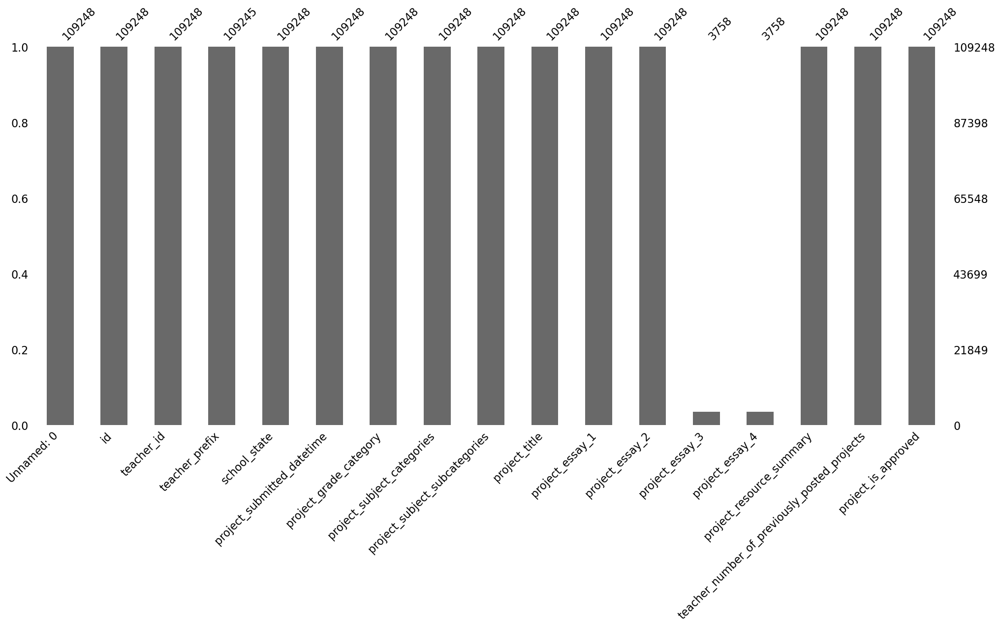

In [8]:
# Visualise missing values

msno.bar(project_data);

## Treat missing values in teacher_id

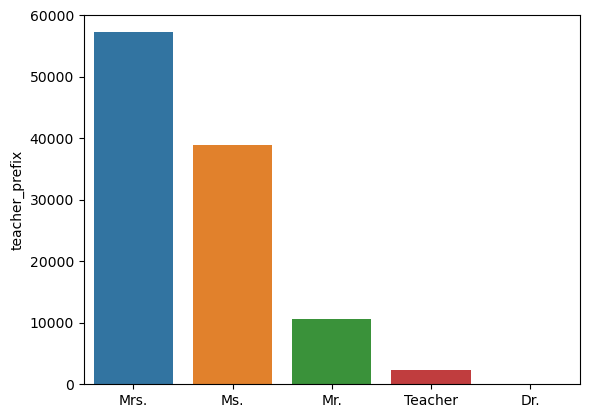

In [9]:
# Visualise the teacher_id
sns.barplot(x=project_data.teacher_prefix.value_counts().index,y= project_data.teacher_prefix.value_counts());

In [10]:
project_data.dropna(subset=['teacher_prefix'], inplace=True) # Drop the 3 missing values from the teacher_prefix colum

In [11]:
# Convert to lower case and remove full stops
project_data['teacher_prefix'] = project_data['teacher_prefix'].str.replace('.', '', regex=False)

project_data['teacher_prefix'] = project_data['teacher_prefix'].str.lower()

## Preprocessing project_essay column

In [12]:
# Merge all the essays into a single feature

project_data["essay"] = project_data["project_essay_1"].map(str) +\
                        project_data["project_essay_2"].map(str) + \
                        project_data["project_essay_3"].map(str) + \
                        project_data["project_essay_4"].map(str)

In [13]:
# https://gist.github.com/sebleier/554280
# Removing the words from the stop words list: 'no', 'nor', 'not'

stopwords= ['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've",\
            "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', \
            'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their',\
            'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', \
            'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', \
            'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', \
            'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after',\
            'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further',\
            'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more',\
            'most', 'other', 'some', 'such', 'only', 'own', 'same', 'so', 'than', 'too', 'very', \
            's', 't', 'can', 'will', 'just', 'don', "don't", 'should', "should've", 'now', 'd', 'll', 'm', 'o', 're', \
            've', 'y', 'ain', 'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn',\
            "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn',\
            "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", \
            'won', "won't", 'wouldn', "wouldn't"]

In [14]:
import re

def decontracted(phrase):
    
    '''Takes a string as input and replaces various English language contractions with their expanded forms'''
    # specific
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase

In [15]:
# Replace newline characters with empty space to get the final essays

preprocessed_essays = []

for sentance in project_data['essay'].values:
    sent = decontracted(sentance)
    sent = sent.replace('\\r', ' ')
    sent = sent.replace('\\"', ' ')
    sent = sent.replace('\\n', ' ')
    sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
   
    sent = ' '.join(e for e in sent.split() if e.lower() not in stopwords)
    preprocessed_essays.append(sent.lower().strip())

In [16]:
# Final essay

project_data["essay"] = preprocessed_essays

In [17]:
# Drop other essays since all has been merged into essay column

project_data.drop(['project_essay_1','project_essay_2','project_essay_3','project_essay_4'], axis=1, inplace=True)

In [18]:
# Preview the essay column

project_data.loc[:5,'essay']

0    students english learners working english seco...
1    students arrive school eager learn polite gene...
2    true champions not always ones win guts mia ha...
3    work unique school filled esl english second l...
4    second grade classroom next year made around 2...
5    moving 2nd grade 3rd grade beginning next scho...
Name: essay, dtype: object

## Processing project_grade_category

In [19]:
project_data.project_grade_category.value_counts()

Grades PreK-2    44225
Grades 3-5       37135
Grades 6-8       16923
Grades 9-12      10962
Name: project_grade_category, dtype: int64

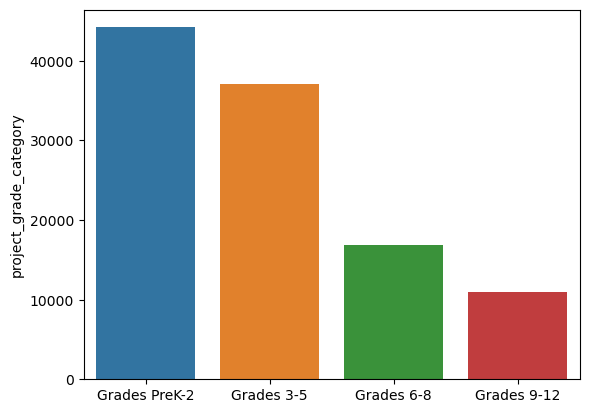

In [20]:
sns.barplot(x=project_data.project_grade_category.value_counts().index,y= project_data.project_grade_category.value_counts());

In [21]:
# Replaces spaces and dashes with underscore, and convert to lower case

project_data['project_grade_category'] = project_data['project_grade_category'].str.replace(' ','_')
project_data['project_grade_category'] = project_data['project_grade_category'].str.replace('-','_')
project_data['project_grade_category'] = project_data['project_grade_category'].str.lower()

In [22]:
project_data['project_grade_category'].values

array(['grades_prek_2', 'grades_6_8', 'grades_6_8', ..., 'grades_prek_2',
       'grades_3_5', 'grades_6_8'], dtype=object)

## Processing school_state

In [23]:
project_data.school_state.values

array(['IN', 'FL', 'AZ', ..., 'NJ', 'NY', 'VA'], dtype=object)

In [24]:
# Convert all the states into lower case

project_data['school_state'] = project_data['school_state'].str.lower()

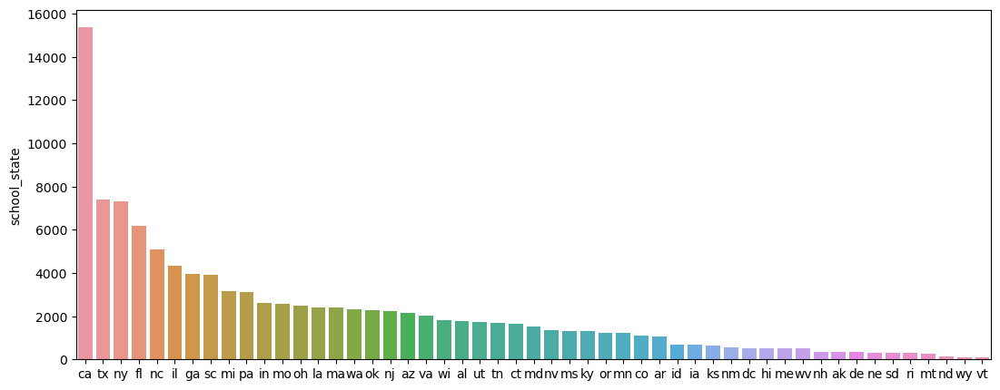

In [25]:
# Visualise the data

plt.figure(figsize=(13,5))
sns.barplot(x=project_data.school_state.value_counts().index,y= project_data.school_state.value_counts());

## Processing project_subject_categories

In [26]:
project_data.project_subject_categories.values

array(['Literacy & Language', 'History & Civics, Health & Sports',
       'Health & Sports', ..., 'Literacy & Language, Math & Science',
       'Health & Sports, Special Needs',
       'Applied Learning, Math & Science'], dtype=object)

In [27]:
# Clean the subject feature

project_data['project_subject_categories'] = project_data['project_subject_categories'].str.replace(' The ','')
project_data['project_subject_categories'] = project_data['project_subject_categories'].str.replace(' ','')
project_data['project_subject_categories'] = project_data['project_subject_categories'].str.replace('&','_')
project_data['project_subject_categories'] = project_data['project_subject_categories'].str.replace(',','_')
project_data['project_subject_categories'] = project_data['project_subject_categories'].str.lower()

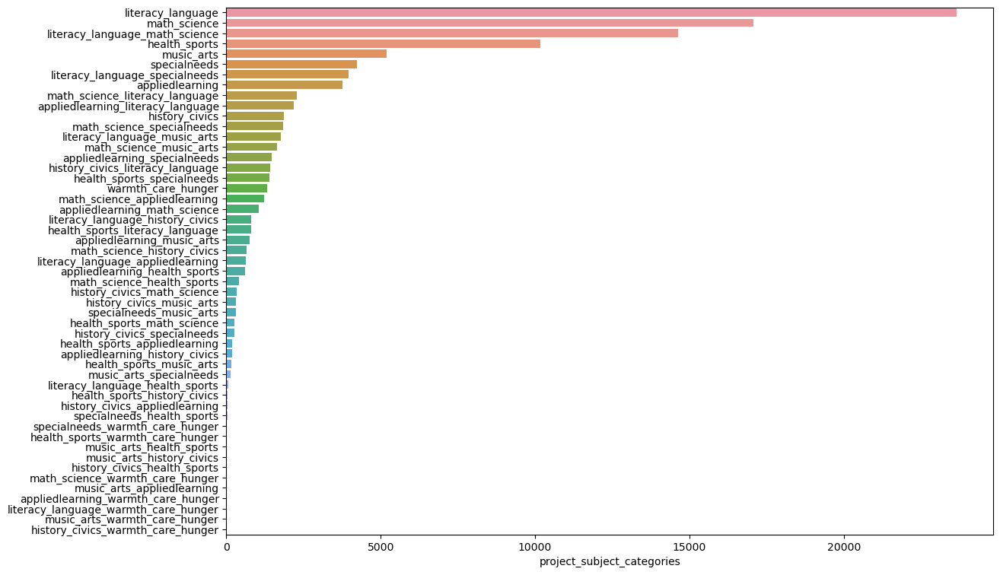

In [28]:
plt.figure(figsize=(13,9))
sns.barplot(y=project_data.project_subject_categories.value_counts().index,x= project_data.project_subject_categories.value_counts());

## Processing project_subject_subcategories

In [29]:
project_data.project_subject_subcategories.values

array(['ESL, Literacy', 'Civics & Government, Team Sports',
       'Health & Wellness, Team Sports', ..., 'Literacy, Mathematics',
       'Health & Wellness, Special Needs',
       'College & Career Prep, Mathematics'], dtype=object)

In [30]:
# Clean the subcategory

project_data['project_subject_subcategories'] = project_data['project_subject_subcategories'].str.replace(' The ','')
project_data['project_subject_subcategories'] = project_data['project_subject_subcategories'].str.replace(' ','')
project_data['project_subject_subcategories'] = project_data['project_subject_subcategories'].str.replace('&','_')
project_data['project_subject_subcategories'] = project_data['project_subject_subcategories'].str.replace(',','_')
project_data['project_subject_subcategories'] = project_data['project_subject_subcategories'].str.lower()


In [31]:
project_data.project_subject_subcategories.value_counts()

literacy                          9486
literacy_mathematics              8324
literature_writing_mathematics    5922
literacy_literature_writing       5571
mathematics                       5379
                                  ... 
communityservice_gym_fitness         1
parentinvolvement_teamsports         1
gym_fitness_socialsciences           1
communityservice_music               1
economics_foreignlanguages           1
Name: project_subject_subcategories, Length: 401, dtype: int64

## Process teacher_number_of_previously_posted_projects

In [32]:
project_data.teacher_number_of_previously_posted_projects.values

array([0, 7, 1, ..., 3, 0, 0], dtype=int64)

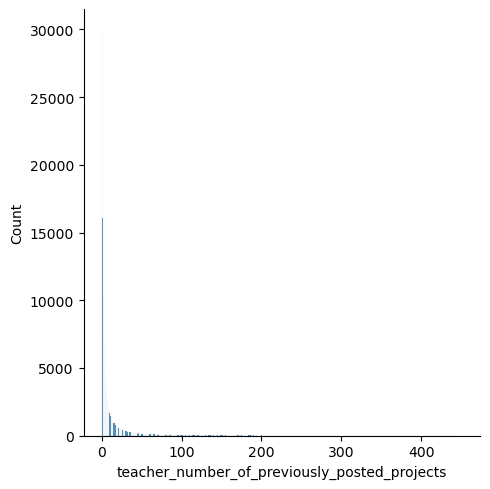

In [33]:
sns.displot(project_data.teacher_number_of_previously_posted_projects)

 ## Processing project title

In [34]:
project_data['project_title'].head(5)

0     Educational Support for English Learners at Home
1                Wanted: Projector for Hungry Learners
2    Soccer Equipment for AWESOME Middle School Stu...
3                               Techie Kindergarteners
4                               Interactive Math Tools
Name: project_title, dtype: object

In [35]:
def preprocess_text(text_data):
    '''preprocesses the text data, and returns a preprocessed list of text data
       replaces escape characters'''
    
    preprocessed_text = []
   
    for sentance in text_data:
        sent = decontracted(sentance)
        sent = sent.replace('\\r', ' ')
        sent = sent.replace('\\n', ' ')
        sent = sent.replace('\\"', ' ')
        sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
       
    
        sent = ' '.join(e for e in sent.split() if e.lower() not in stopwords)
        preprocessed_text.append(sent.lower().strip())
    return preprocessed_text

preprocessed_titles = preprocess_text(project_data['project_title'].values)

In [36]:
project_data.project_title = preprocessed_titles 

In [37]:
project_data.project_title

0                 educational support english learners home
1                          wanted projector hungry learners
2           soccer equipment awesome middle school students
3                                    techie kindergarteners
4                                    interactive math tools
                                ...                        
109243    privacy shields help promote independent thinking
109244                                 technology classroom
109245                      2016 2017 beginning year basics
109246                 flexible seating inclusive classroom
109247          classroom tech develop 21st century leaders
Name: project_title, Length: 109245, dtype: object

## Preprocessing Data in Resource Data


In [38]:
resource_data.head()

,id,description,quantity,price
0,p233245,LC652 - Lakeshore Double-Space Mobile Drying Rack,1,149.00
1,p069063,Bouncy Bands for Desks (Blue support pipes),3,14.95
2,p069063,Cory Stories: A Kid's Book About Living With Adhd,1,8.45
3,p069063,"Dixon Ticonderoga Wood-Cased #2 HB Pencils, Bo...",2,13.59
4,p069063,EDUCATIONAL INSIGHTS FLUORESCENT LIGHT FILTERS...,3,24.95


In [39]:
resource_data.info() # General information about the data

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1541272 entries, 0 to 1541271
Data columns (total 4 columns):
 #   Column       Non-Null Count    Dtype  
---  ------       --------------    -----  
 0   id           1541272 non-null  object 
 1   description  1540980 non-null  object 
 2   quantity     1541272 non-null  int64  
 3   price        1541272 non-null  float64
dtypes: float64(1), int64(1), object(2)
memory usage: 47.0+ MB


In [40]:
resource_data.isnull().sum() # Check for missing values

id               0
description    292
quantity         0
price            0
dtype: int64

We wont use the description feature, hence we will just drop it. 

<AxesSubplot:>

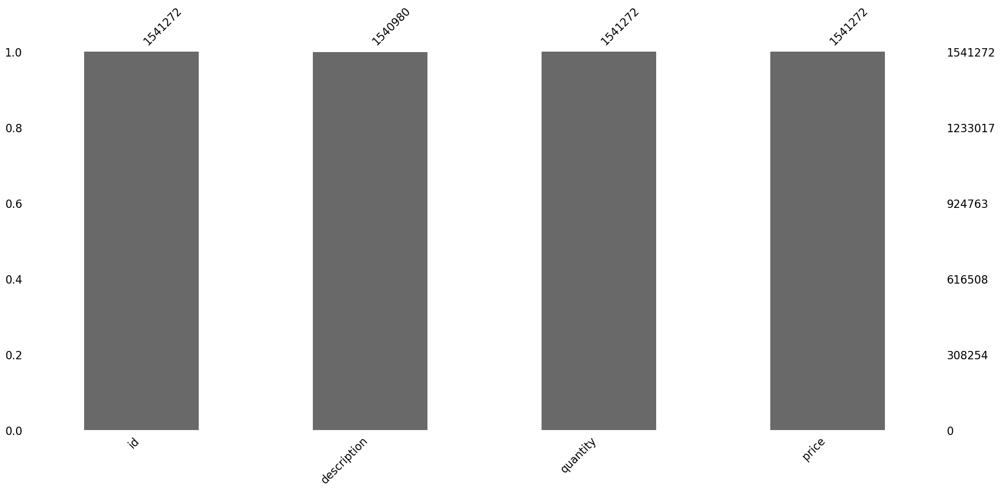

In [41]:
msno.bar(resource_data)

## Processing Price

In [42]:
price_data = resource_data.groupby('id').agg({'price':'sum', 'quantity':'sum'}).reset_index()
price_data.head(2)

,id,price,quantity
0,p000001,459.56,7
1,p000002,515.89,21


In [43]:
# join two dataframes in python: 
project_data = pd.merge(project_data, price_data, on='id', how='left')

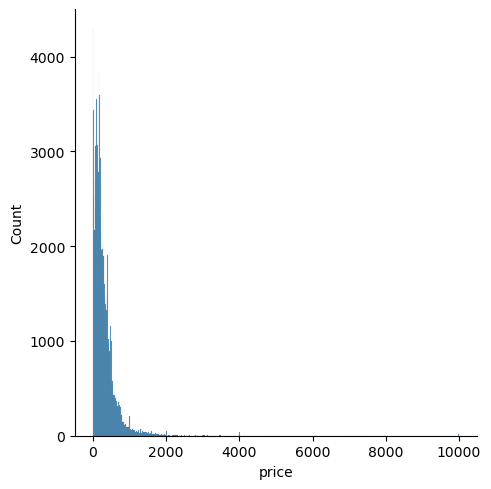

In [44]:
sns.displot(project_data.price);

In [45]:
project_data.head() # Preview

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_subject_categories,project_subject_subcategories,project_title,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,essay,price,quantity
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,mrs,in,2016-12-05 13:43:57,grades_prek_2,literacy_language,esl_literacy,educational support english learners home,My students need opportunities to practice beg...,0,0,students english learners working english seco...,154.60,23
1,140945,p258326,897464ce9ddc600bced1151f324dd63a,mr,fl,2016-10-25 09:22:10,grades_6_8,history_civics_health_sports,civics_government_teamsports,wanted projector hungry learners,My students need a projector to help with view...,7,1,students arrive school eager learn polite gene...,299.00,1
2,21895,p182444,3465aaf82da834c0582ebd0ef8040ca0,ms,az,2016-08-31 12:03:56,grades_6_8,health_sports,health_wellness_teamsports,soccer equipment awesome middle school students,"My students need shine guards, athletic socks,...",1,0,true champions not always ones win guts mia ha...,516.85,22
3,45,p246581,f3cb9bffbba169bef1a77b243e620b60,mrs,ky,2016-10-06 21:16:17,grades_prek_2,literacy_language_math_science,literacy_mathematics,techie kindergarteners,My students need to engage in Reading and Math...,4,1,work unique school filled esl english second l...,232.90,4
4,172407,p104768,be1f7507a41f8479dc06f047086a39ec,mrs,tx,2016-07-11 01:10:09,grades_prek_2,math_science,mathematics,interactive math tools,My students need hands on practice in mathemat...,1,1,second grade classroom next year made around 2...,67.98,4


## Removing columns we dont need


In [46]:

project_data.drop(['Unnamed: 0','id','teacher_id','project_submitted_datetime','quantity','project_resource_summary'], axis=1, inplace=True)

In [47]:
# Final data

project_data.head()

,teacher_prefix,school_state,project_grade_category,project_subject_categories,project_subject_subcategories,project_title,teacher_number_of_previously_posted_projects,project_is_approved,essay,price
0,mrs,in,grades_prek_2,literacy_language,esl_literacy,educational support english learners home,0,0,students english learners working english seco...,154.60
1,mr,fl,grades_6_8,history_civics_health_sports,civics_government_teamsports,wanted projector hungry learners,7,1,students arrive school eager learn polite gene...,299.00
2,ms,az,grades_6_8,health_sports,health_wellness_teamsports,soccer equipment awesome middle school students,1,0,true champions not always ones win guts mia ha...,516.85
3,mrs,ky,grades_prek_2,literacy_language_math_science,literacy_mathematics,techie kindergarteners,4,1,work unique school filled esl english second l...,232.90
4,mrs,tx,grades_prek_2,math_science,mathematics,interactive math tools,1,1,second grade classroom next year made around 2...,67.98


##  Splitting data into Train and Cross Validation(or test): Stratified Sampling

In [48]:
# Use 10000 rows of data

project_data_copy =project_data.copy()
project_data = project_data_copy.sample(n = 100000)

In [49]:
# Check for shape


project_data.shape

(100000, 10)

In [50]:
# Get your x and y

y = project_data['project_is_approved'].values
X = project_data.drop(['project_is_approved'], axis=1)

# Preview
X.head(1)

,teacher_prefix,school_state,project_grade_category,project_subject_categories,project_subject_subcategories,project_title,teacher_number_of_previously_posted_projects,essay,price
29278,ms,in,grades_prek_2,math_science_literacy_language,appliedsciences_literature_writing,stem provide future creators problem solvers,0,everyday students walk classroom door get welc...,307.27


In [51]:
# Split data into train and test set

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, stratify =y,random_state=0)
X_train, X_cv, y_train, y_cv = train_test_split(X_train, y_train, test_size=0.33, stratify=y_train,random_state=0)

In [52]:
# Import revelant libraries

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import Normalizer
from scipy.sparse import hstack
from sklearn.model_selection import GridSearchCV

%matplotlib inline

### Bag of Words on the Essays

In [53]:
# Perform Bag of Words on Essays

vectorizer_essay = CountVectorizer(min_df=10,ngram_range=(1,4), max_features=5000)
vectorizer_essay.fit(X_train['essay'].values) # fit has to happen only on train data

X_train_essay_bow = vectorizer_essay.transform(X_train['essay'].values)
X_cv_essay_bow = vectorizer_essay.transform(X_cv['essay'].values)
X_test_essay_bow = vectorizer_essay.transform(X_test['essay'].values)


In [54]:
print("After vectorizations")
print(X_train_essay_bow.shape, y_train.shape)
print(X_cv_essay_bow.shape, y_cv.shape)
print(X_test_essay_bow.shape, y_test.shape)

After vectorizations
(44890, 5000) (44890,)
(22110, 5000) (22110,)
(33000, 5000) (33000,)


### TFIDF on the Essays

In [55]:
# Perform TFIDF
vectorizer_essay_tfidf = TfidfVectorizer(min_df=10)
vectorizer_essay_tfidf.fit(X_train.essay.values)


X_train_essay_tfidf = vectorizer_essay_tfidf.transform(X_train['essay'].values)
X_cv_essay_tfidf = vectorizer_essay_tfidf.transform(X_cv['essay'].values)
X_test_essay_tfidf = vectorizer_essay_tfidf.transform(X_test['essay'].values)


In [56]:
print("After vectorizations")
print(X_train_essay_tfidf.shape, y_train.shape)
print(X_cv_essay_tfidf.shape, y_cv.shape)
print(X_test_essay_tfidf.shape, y_test.shape)

After vectorizations
(44890, 11647) (44890,)
(22110, 11647) (22110,)
(33000, 11647) (33000,)


### Glove Embeddings on Essays

In [57]:
# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/

with open('glove_vectors', 'rb') as f:
    model = pickle.load(f)
    glove_words =  set(model.keys())

In [58]:
# average Word2Vec
# compute average word2vec for each review.
avg_w2v_vectors_train = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(X_train['essay']): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if word in glove_words:
            vector += model[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    avg_w2v_vectors_train.append(vector)

print(len(avg_w2v_vectors_train))
print(len(avg_w2v_vectors_train[0]))

100%|██████████████████████████████████████████████████████████████████████████| 44890/44890 [00:26<00:00, 1701.21it/s]

44890
300


In [59]:
# average Word2Vec
# compute average word2vec for each review.
avg_w2v_vectors_test = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(X_test['essay']): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if word in glove_words:
            vector += model[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    avg_w2v_vectors_test.append(vector)

print(len(avg_w2v_vectors_test))
print(len(avg_w2v_vectors_test[0]))

100%|██████████████████████████████████████████████████████████████████████████| 33000/33000 [00:19<00:00, 1690.12it/s]

33000
300


### Bag of Words on Titles

In [60]:
# Bag on Titles
vectorizer_title = CountVectorizer(min_df=10,ngram_range=(1,4), max_features=5000)
vectorizer_title.fit(X_train['project_title'].values) # fit has to happen only on train data

# Transform
X_train_title_bow = vectorizer_title.transform(X_train['project_title'].values)
X_cv_title_bow = vectorizer_title.transform(X_cv['project_title'].values)
X_test_title_bow = vectorizer_title.transform(X_test['project_title'].values)


In [61]:
print("After vectorizations")
print(X_train_title_bow.shape, y_train.shape)
print(X_cv_title_bow.shape, y_cv.shape)
print(X_test_title_bow.shape, y_test.shape)

After vectorizations
(44890, 3135) (44890,)
(22110, 3135) (22110,)
(33000, 3135) (33000,)


### TFIDF on Titles

In [62]:
# Perform TFIDF
vectorizer_tfidf_title = TfidfVectorizer(min_df=10)
vectorizer_tfidf_title.fit(X_train.project_title.values)

# Transform
X_train_project_title_tfidf = vectorizer_tfidf_title.transform(X_train['project_title'].values)
X_cv_project_title_tfidf = vectorizer_tfidf_title.transform(X_cv['project_title'].values)
X_test_project_title_tfidf = vectorizer_tfidf_title.transform(X_test['project_title'].values)

In [63]:
print("After vectorizations")
print(X_train_project_title_tfidf.shape, y_train.shape)
print(X_cv_project_title_tfidf.shape, y_cv.shape)
print(X_test_project_title_tfidf.shape, y_test.shape)

After vectorizations
(44890, 1883) (44890,)
(22110, 1883) (22110,)
(33000, 1883) (33000,)


# Vectorizing Categorical Data

### Encoding School State

In [64]:
vectorizer_state = CountVectorizer()
vectorizer_state.fit(X_train['school_state'].values) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
X_train_state_ohe = vectorizer_state.transform(X_train['school_state'].values)
X_cv_state_ohe = vectorizer_state.transform(X_cv['school_state'].values)
X_test_state_ohe = vectorizer_state.transform(X_test['school_state'].values)


In [65]:
print("After vectorizations")
print(X_train_state_ohe.shape, y_train.shape)
print(X_cv_state_ohe.shape, y_cv.shape)
print(X_test_state_ohe.shape, y_test.shape)
print(vectorizer_state.get_feature_names_out())

After vectorizations
(44890, 51) (44890,)
(22110, 51) (22110,)
(33000, 51) (33000,)
['ak' 'al' 'ar' 'az' 'ca' 'co' 'ct' 'dc' 'de' 'fl' 'ga' 'hi' 'ia' 'id'
 'il' 'in' 'ks' 'ky' 'la' 'ma' 'md' 'me' 'mi' 'mn' 'mo' 'ms' 'mt' 'nc'
 'nd' 'ne' 'nh' 'nj' 'nm' 'nv' 'ny' 'oh' 'ok' 'or' 'pa' 'ri' 'sc' 'sd'
 'tn' 'tx' 'ut' 'va' 'vt' 'wa' 'wi' 'wv' 'wy']


### Encoding Teacher Prefixes

In [66]:
vectorizer_teacher = CountVectorizer()
vectorizer_teacher.fit(X_train['teacher_prefix'].values) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
X_train_teacher_ohe = vectorizer_teacher.transform(X_train['teacher_prefix'].values)
X_cv_teacher_ohe = vectorizer_teacher.transform(X_cv['teacher_prefix'].values)
X_test_teacher_ohe = vectorizer_teacher.transform(X_test['teacher_prefix'].values)



In [67]:
print("After vectorizations")
print(X_train_teacher_ohe.shape, y_train.shape)
print(X_cv_teacher_ohe.shape, y_cv.shape)
print(X_test_teacher_ohe.shape, y_test.shape)
print(vectorizer_teacher.get_feature_names_out())

After vectorizations
(44890, 5) (44890,)
(22110, 5) (22110,)
(33000, 5) (33000,)
['dr' 'mr' 'mrs' 'ms' 'teacher']


### Encoding Grades

In [68]:
vectorizer_grade = CountVectorizer()
vectorizer_grade.fit(X_train['project_grade_category'].values) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
X_train_grade_ohe = vectorizer_grade.transform(X_train['project_grade_category'].values)
X_cv_grade_ohe = vectorizer_grade.transform(X_cv['project_grade_category'].values)
X_test_grade_ohe = vectorizer_grade.transform(X_test['project_grade_category'].values)



In [69]:
print("After vectorizations")
print(X_train_grade_ohe.shape, y_train.shape)
print(X_cv_grade_ohe.shape, y_cv.shape)
print(X_test_grade_ohe.shape, y_test.shape)

After vectorizations
(44890, 4) (44890,)
(22110, 4) (22110,)
(33000, 4) (33000,)


### Encoding Subject Categories

In [70]:

vectorizer_sub = CountVectorizer()
vectorizer_sub.fit(X_train['project_subject_categories'].values) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
X_train_project_subject_categories_ohe = vectorizer_sub.transform(X_train['project_subject_categories'].values)
X_cv_project_subject_categories_ohe = vectorizer_sub.transform(X_cv['project_subject_categories'].values)
X_test_project_subject_categories_ohe = vectorizer_sub.transform(X_test['project_subject_categories'].values)

In [71]:
print("After vectorizations")
print(X_train_project_subject_categories_ohe.shape, y_train.shape)
print(X_cv_project_subject_categories_ohe.shape, y_cv.shape)
print(X_test_project_subject_categories_ohe.shape, y_test.shape)

After vectorizations
(44890, 50) (44890,)
(22110, 50) (22110,)
(33000, 50) (33000,)


### Encoding Subject Subcategories

In [72]:
vectorizer_sub_subcat = CountVectorizer()
vectorizer_sub_subcat.fit(X_train['project_subject_subcategories'].values) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
X_train_project_subject_subcategories_ohe = vectorizer_sub_subcat.transform(X_train['project_subject_subcategories'].values)
X_cv_project_subject_subcategories_ohe = vectorizer_sub_subcat.transform(X_cv['project_subject_subcategories'].values)
X_test_project_subject_subcategories_ohe = vectorizer_sub_subcat.transform(X_test['project_subject_subcategories'].values)

In [73]:
print("After vectorizations")
print(X_train_project_subject_subcategories_ohe.shape, y_train.shape)
print(X_cv_project_subject_subcategories_ohe.shape, y_cv.shape)
print(X_test_project_subject_subcategories_ohe.shape, y_test.shape)

After vectorizations
(44890, 370) (44890,)
(22110, 370) (22110,)
(33000, 370) (33000,)


# Normalizing Numerical Features

### Normalize the price feature

In [74]:
normalizer_price = Normalizer()
# Convert into a 2D for the normalizer
normalizer_price.fit(X_train['price'].values.reshape(-1,1))

X_train_price_norm = normalizer_price.transform(X_train['price'].values.reshape(1,-1).reshape(-1,1))
X_cv_price_norm = normalizer_price.transform(X_cv['price'].values.reshape(1,-1).reshape(-1,1))
X_test_price_norm = normalizer_price.transform(X_test['price'].values.reshape(1,-1).reshape(-1,1))

In [75]:
print("After vectorizations")
print(X_train_price_norm.shape, y_train.shape)
print(X_cv_price_norm.shape, y_cv.shape)
print(X_test_price_norm.shape, y_test.shape)

After vectorizations
(44890, 1) (44890,)
(22110, 1) (22110,)
(33000, 1) (33000,)


### Normalize the number of posted projects

In [76]:

normalizer_num_proj = Normalizer()
# Convert into a 2D for the normalizer
normalizer_num_proj.fit(X_train['teacher_number_of_previously_posted_projects'].values.reshape(-1,1))

X_train_teacher_number_of_previously_posted_projects_norm = normalizer_num_proj.transform(X_train['teacher_number_of_previously_posted_projects'].values.reshape(1,-1).reshape(-1,1))
X_cv_teacher_number_of_previously_posted_projects_norm = normalizer_num_proj.transform(X_cv['teacher_number_of_previously_posted_projects'].values.reshape(1,-1).reshape(-1,1))
X_test_teacher_number_of_previously_posted_projects_norm = normalizer_num_proj.transform(X_test['teacher_number_of_previously_posted_projects'].values.reshape(1,-1).reshape(-1,1))

In [77]:
print("After vectorizations")
print(X_train_teacher_number_of_previously_posted_projects_norm.shape, y_train.shape)
print(X_cv_teacher_number_of_previously_posted_projects_norm.shape, y_cv.shape)
print(X_test_teacher_number_of_previously_posted_projects_norm.shape, y_test.shape)

After vectorizations
(44890, 1) (44890,)
(22110, 1) (22110,)
(33000, 1) (33000,)


# Merge all the Features 

### One hot encoded data with TFIDF

In [78]:
# Merge all one hot encorded data with TFIDF

X_tr = hstack((X_train_state_ohe, X_train_teacher_ohe, 
               X_train_grade_ohe, X_train_price_norm,
               X_train_teacher_number_of_previously_posted_projects_norm,
               X_train_project_subject_subcategories_ohe,X_train_essay_tfidf,
               X_train_project_title_tfidf,
               X_train_project_subject_categories_ohe)).tocsr()

# cross val
X_cv = hstack(( X_cv_state_ohe, X_cv_teacher_ohe, X_cv_grade_ohe,
               X_cv_price_norm,X_cv_essay_tfidf,
               X_cv_teacher_number_of_previously_posted_projects_norm,
               X_cv_project_subject_subcategories_ohe,X_cv_project_title_tfidf,
               X_cv_project_subject_categories_ohe,)).tocsr()

# Test set
X_te = hstack(( X_test_state_ohe, X_test_teacher_ohe,
               X_test_grade_ohe, X_test_price_norm,X_test_teacher_number_of_previously_posted_projects_norm,
               X_test_project_subject_subcategories_ohe,X_test_project_subject_categories_ohe,
               X_test_essay_tfidf,X_test_project_title_tfidf
              )).tocsr()

## Build  Decision Tree Model

In [79]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
tree_parameters = {'max_depth': [1, 5, 10, 50], 
                  'min_samples_split': [5, 10, 100, 500]}

decision_tree= DecisionTreeClassifier(class_weight='balanced') 
clf = GridSearchCV(decision_tree, tree_parameters, cv=5, scoring='roc_auc', return_train_score=True, n_jobs=-1)
clf.fit(X_tr,y_train)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(class_weight='balanced'),
             n_jobs=-1,
             param_grid={'max_depth': [1, 5, 10, 50],
                         'min_samples_split': [5, 10, 100, 500]},
             return_train_score=True, scoring='roc_auc')

In [80]:
train_auc= clf.cv_results_['mean_train_score']
train_auc_std= clf.cv_results_['std_train_score']
cv_auc = clf.cv_results_['mean_test_score'] 
cv_auc_std= clf.cv_results_['std_test_score']

In [81]:
print('Best score: ',clf.best_score_)
print('Best Hyper parameters: ',clf.best_params_)

Best score:  0.6240710382682503
Best Hyper parameters:  {'max_depth': 10, 'min_samples_split': 500}


In [82]:
import plotly.offline as offline
import plotly.graph_objs as go
from itertools import repeat
max_depth = [1, 5, 10, 50]
min_samples_split = [5, 10, 100, 500]

# Variable parameters for the plot
x1= max_depth
y1= min_samples_split
z1= train_auc
z2= cv_auc

In [83]:
# create a 3D scatter plot with two traces ("train_auc" and "cv_auc") representing different data sets. 
trace1 = go.Scatter3d(x=x1,y=y1,z=z1, name="train_auc")
trace2 = go.Scatter3d(x=x1,y=y1,z=z2, name="cv_auc")
data = [trace1, trace2]

layout = go.Layout(scene = dict(
        xaxis = dict(title='max_depth'),
        yaxis = dict(title='min_samples_split'),
        zaxis = dict(title='AUC SCORE'),))

fig = go.Figure(data=data, layout=layout)
offline.iplot(fig, filename='3d-scatter-colorscale')

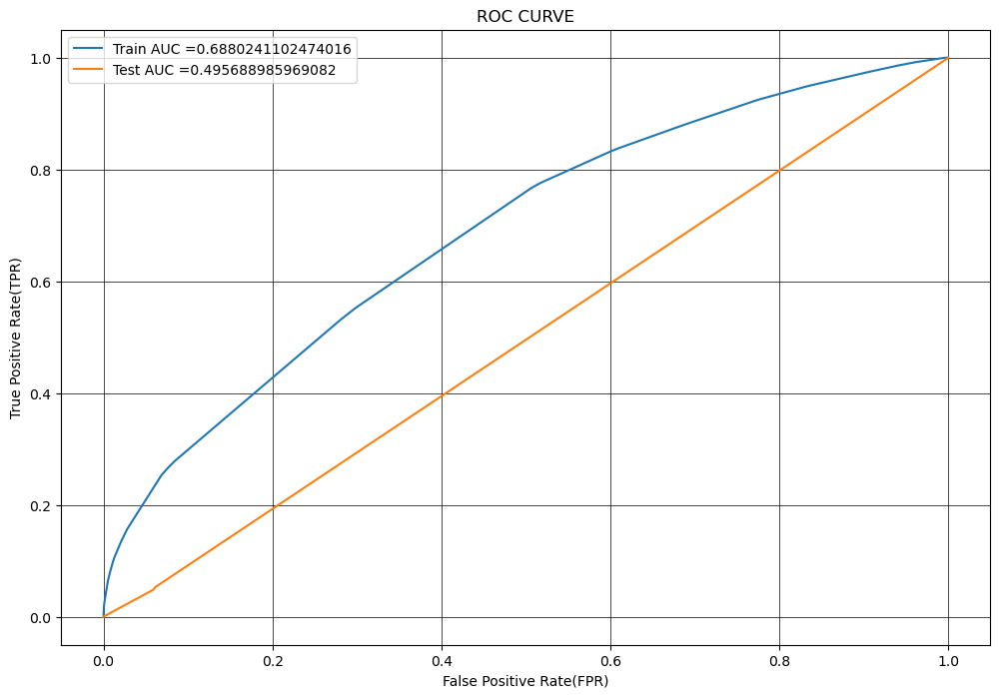

In [84]:
# plots the ROC curve using Matplotlib, with the FPR on the x-axis and TPR on the y-axis. 

model_set1=DecisionTreeClassifier(class_weight='balanced',max_depth = clf.best_params_["max_depth"],min_samples_split = clf.best_params_["min_samples_split"])
model_set1.fit(X_tr,y_train)
y_train_probs = clf.predict_proba(X_tr)[:,1] # converting train and test output into probability
y_test_probs= clf.predict_proba(X_te)[:,1]

train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, y_train_probs) # storing values of fpr and tpr
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_probs)

plt.figure(figsize=(12,8))
plt.plot(train_fpr, train_tpr, label="Train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="Test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("False Positive Rate(FPR)")
plt.ylabel("True Positive Rate(TPR)")
plt.title("ROC CURVE")
plt.grid(color='black',lw=0.5)

### The resulting plot shows the ROC curves for the training and test datasets, with AUC values indicating the performance of the decision tree model in terms of classification accuracy.

In [85]:
def find_best_threshold(threshould, fpr, tpr):
    t = threshould[np.argmax(tpr*(1-fpr))]
    # (tpr*(1-fpr)) will be maximum if your fpr is very low and tpr is very high
    print("the maximum value of tpr*(1-fpr)", max(tpr*(1-fpr)), "for threshold", np.round(t,3))
    return t

def predict_with_best_t(proba, threshould):
    predictions = []
    for i in proba:
        if i>=threshould:
            predictions.append(1)
        else:
            predictions.append(0)
    return predictions

#### Train Data

the maximum value of tpr*(1-fpr) 0.38775538116788827 for threshold 0.54
CONFUSION MATRIX OF TRAIN DATA


[[ 4756  2031]
 [17019 21084]]


Text(0.5, 1.0, 'Train Data Confusion Matrix')

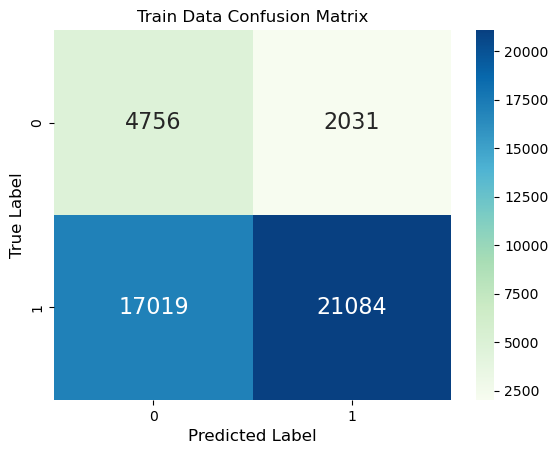

In [86]:
best_t = find_best_threshold(tr_thresholds, train_fpr, train_tpr)
cm=metrics.confusion_matrix(y_train,predict_with_best_t(y_train_probs, best_t))  # https://stackoverflow.com/questions/35572000/how-can-i-plot-a-confusion-matrix

print("CONFUSION MATRIX OF TRAIN DATA")
print("\n")
print(cm)
sns.heatmap(cm, annot=True, fmt='d',cmap='GnBu',annot_kws = {"size":16})
plt.ylabel('True Label',size=12)
plt.xlabel('Predicted Label',size=12)
plt.title('Train Data Confusion Matrix',size=12)


####  Test Data

the maximum value of tpr*(1-fpr) 0.050694176643182834 for threshold 0.563
CONFUSION MATRIX OF TEST DATA


[[ 4680   310]
 [26496  1514]]


Text(0.5, 1.0, 'Test Data Confusion Matrix')

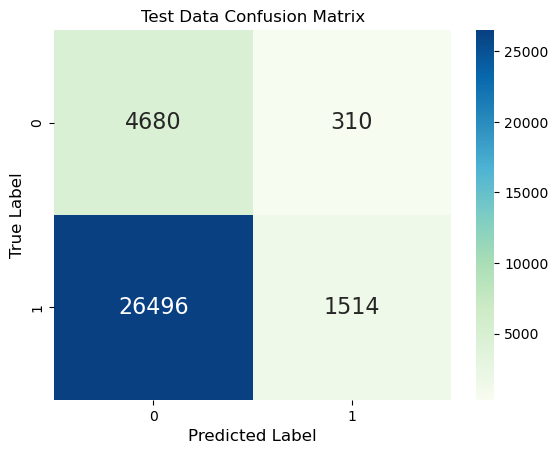

In [87]:
best_t = find_best_threshold(te_thresholds, test_fpr, test_tpr)  # Find the best threshold based on test data ROC curve
cm = metrics.confusion_matrix(y_test, predict_with_best_t(y_test_probs, best_t))  # Compute the confusion matrix

print("CONFUSION MATRIX OF TEST DATA")  # Print the title for the confusion matrix
print('\n')  # Print a blank line
print(cm)  # Print the confusion matrix
sns.heatmap(cm, annot=True, fmt='d', cmap='GnBu', annot_kws={"size": 16})  # Generate a heatmap of the confusion matrix using Seaborn
plt.ylabel('True Label', size=12)  # Set the y-axis label for the plot
plt.xlabel('Predicted Label', size=12)  # Set the x-axis label for the plot
plt.title('Test Data Confusion Matrix', size=12)  # Set the title for the plot


### Getting All the False Positive Data Points

In [88]:
predict=predict_with_best_t(y_test_probs,best_t)

In [89]:
fpi = []
for i in range(len(y_test)):
    if(y_test[i]==0) & (predict[i] == 1):
        fpi.append(i)
len(fpi)

310

In [90]:

# Create an empty DataFrame with column names from X_test DataFrame
cols = X_test.columns
X_test_false_Positive = pd.DataFrame(columns=cols)

# Extract rows from X_test DataFrame that correspond to false positive predictions
X_test_false_Positive = X_test.iloc[fpi]

# Print the shape of X_test_false_Positive DataFrame
print(X_test_false_Positive.shape)   

(310, 9)


In [91]:
X_test_false_Positive.head(1)

,teacher_prefix,school_state,project_grade_category,project_subject_categories,project_subject_subcategories,project_title,teacher_number_of_previously_posted_projects,essay,price
55395,ms,pa,grades_6_8,math_science,appliedsciences,geek stem steam d110,0,students come classroom not knowing expect eve...,633.64


#### wordcloud Of Essay Text For False Positive Dataset


In [92]:
from wordcloud import WordCloud, STOPWORDS  # Import necessary libraries

comment_words = ' '  # Initialize an empty string to store the concatenated words
stopwords = set(STOPWORDS)  # Create a set of stopwords from the STOPWORDS library

# Iterate over each word in the 'essay' column of the 'X_test_false_Positive' DataFrame
for word in X_test_false_Positive['essay']:
    val = str(word)  # Convert the word to a string
    tokens = val.split()  # Split the string into a list of words
    
    # Convert each word to lowercase
    for i in range(len(tokens)):
        tokens[i] = tokens[i].lower()
    
    # Concatenate each word to the 'comment_words' string, separated by a space
    for words in tokens:
        comment_words = comment_words + words + ' '


In [93]:
wordcloud = WordCloud(width = 800, height = 800, background_color ='white',  # Create a WordCloud object with specified width, height, background color, and stopwords
                     stopwords = stopwords, min_font_size = 10).generate(comment_words)


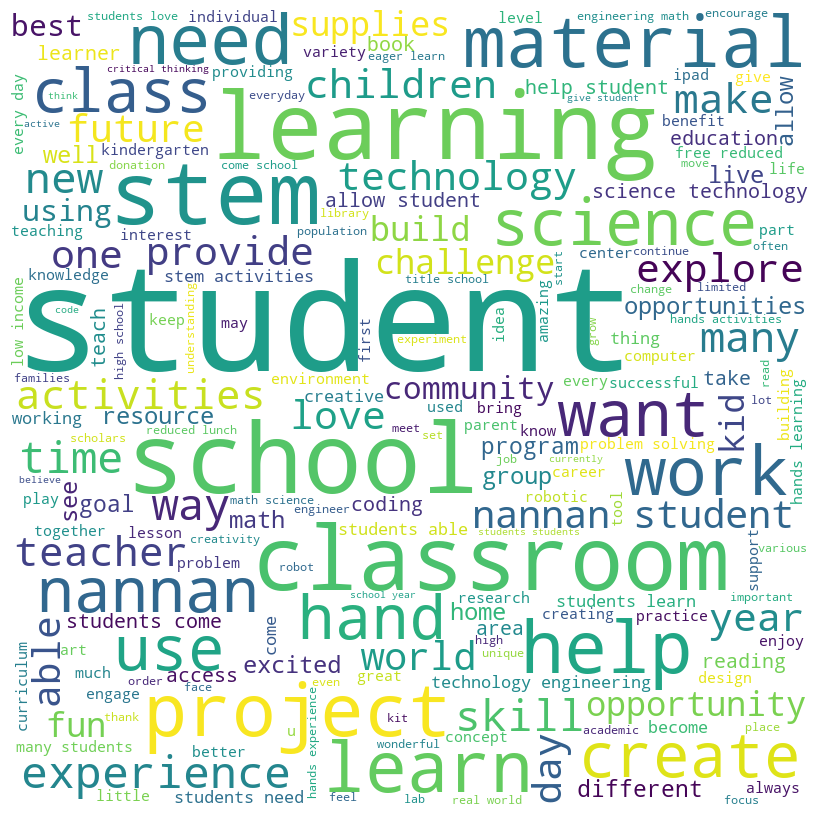

In [94]:
plt.figure(figsize = (8, 8), facecolor = None)  # Create a new figure with width and height both set to 8 inches, with no facecolor
plt.imshow(wordcloud)  # Display the generated WordCloud plot as an image
plt.axis("off")  # Turn off the axis labels and ticks
plt.tight_layout(pad = 0)  # Adjust the layout of the plot to remove any padding

plt.show()  # Display the plot


#### Box Plot With The Price Of These False Positive Data Points

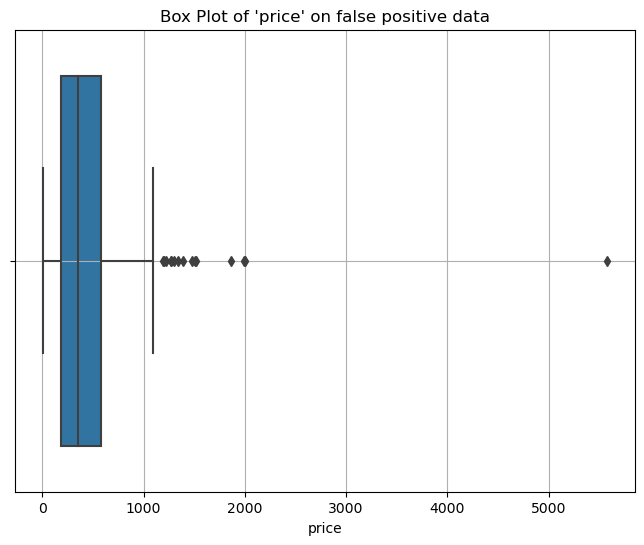

In [95]:
plt.figure(figsize=(8,6))
sns.boxplot('price',data=X_test_false_Positive,orient="v").set_title("Box Plot of 'price' on false positive data")
plt.grid()

#### Pdf Plot With The teacher_number_of_previously_posted_projects Of These False Positive Data Points

[0.88709677 0.06774194 0.00645161 0.00645161 0.00967742 0.00645161
 0.00967742 0.00322581 0.         0.00322581]
[  0.   17.9  35.8  53.7  71.6  89.5 107.4 125.3 143.2 161.1 179. ]


Text(0.5, 0, 'teacher_number_of_previously_posted_projects')

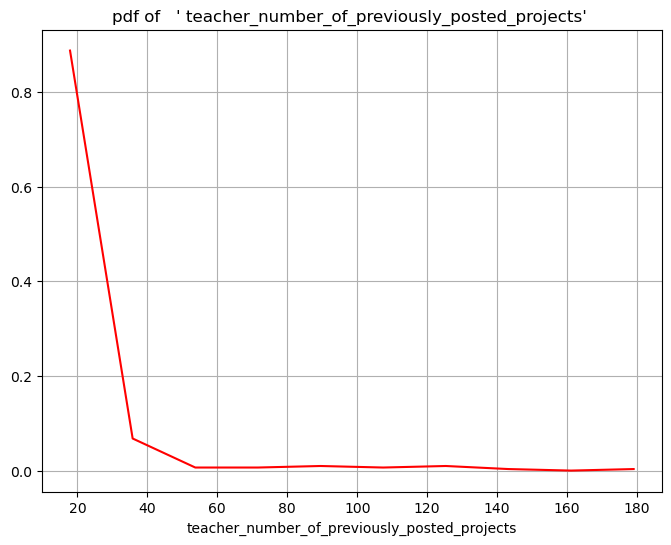

In [96]:
plt.figure(figsize=(8,6))
plt.grid()
counts, bin_edges = np.histogram(X_test_false_Positive['teacher_number_of_previously_posted_projects'], bins=10, 
                                density = True)
pdf = counts/(sum(counts))
print(pdf);
print(bin_edges)
plt.plot(bin_edges[1:],pdf,color="red")
plt.title("pdf of   ' teacher_number_of_previously_posted_projects' ")
plt.xlabel('teacher_number_of_previously_posted_projects')


###  DECISION TREE USING GRID SEARCH CROSS VALIDATION (SET - 2)

In [97]:
### One hot encoded data with TFIDF W2V

#  Use the hcstack function to horizontally stacks sparse matrice(your train,val and test)
# Use the tocsr() function for easy numerical computation

X_tr = hstack((avg_w2v_vectors_train,X_train_state_ohe, X_train_teacher_ohe, 
               X_train_grade_ohe, X_train_price_norm,X_train_title_bow,
               X_train_teacher_number_of_previously_posted_projects_norm,
               X_train_project_subject_subcategories_ohe,
               X_train_project_subject_categories_ohe)).tocsr()

X_cv = hstack((X_cv_essay_bow, X_cv_state_ohe, X_cv_teacher_ohe, X_cv_grade_ohe,
               X_cv_price_norm,X_cv_title_bow,
               X_cv_teacher_number_of_previously_posted_projects_norm,
               X_cv_project_subject_subcategories_ohe,
               X_cv_project_subject_categories_ohe,)).tocsr()


X_te = hstack((avg_w2v_vectors_test, X_test_state_ohe, X_test_teacher_ohe,
               X_test_grade_ohe, X_test_price_norm,X_test_teacher_number_of_previously_posted_projects_norm,
               X_test_project_subject_subcategories_ohe,X_test_project_subject_categories_ohe,
               X_test_title_bow
              )).tocsr()

In [98]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
tree_parameters = {'max_depth': [1, 5, 10, 50], 
                  'min_samples_split': [5, 10, 100, 500]}

decision_tree= DecisionTreeClassifier(class_weight='balanced') 
clf = GridSearchCV(decision_tree, tree_parameters, cv=5, scoring='roc_auc', return_train_score=True, n_jobs=-1)
clf.fit(X_tr,y_train)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(class_weight='balanced'),
             n_jobs=-1,
             param_grid={'max_depth': [1, 5, 10, 50],
                         'min_samples_split': [5, 10, 100, 500]},
             return_train_score=True, scoring='roc_auc')

In [99]:
train_auc= clf.cv_results_['mean_train_score']
train_auc_std= clf.cv_results_['std_train_score']
cv_auc = clf.cv_results_['mean_test_score'] 
cv_auc_std= clf.cv_results_['std_test_score']

In [100]:
print('Best score: ',clf.best_score_)
print('Best Hyper parameters: ',clf.best_params_)

Best score:  0.6035513441716833
Best Hyper parameters:  {'max_depth': 5, 'min_samples_split': 500}


#### Plotting Hyperparameter v/s Auc

In [101]:
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()

In [102]:
from itertools import repeat
max_depth = [1, 5, 10, 50]
min_samples_split = [5, 10, 100, 500]

x1= max_depth
y1= min_samples_split
z1= train_auc
z2= cv_auc

In [103]:

trace1 = go.Scatter3d(x=x1,y=y1,z=z1, name="train_auc")
trace2 = go.Scatter3d(x=x1,y=y1,z=z2, name="cv_auc")
data = [trace1, trace2]

layout = go.Layout(scene = dict(
        xaxis = dict(title='max_depth'),
        yaxis = dict(title='min_samples_split'),
        zaxis = dict(title='AUC SCORE'),))

fig = go.Figure(data=data, layout=layout)
offline.iplot(fig, filename='3d-scatter-colorscale')

#### Roc Plot Of Train And Test Data

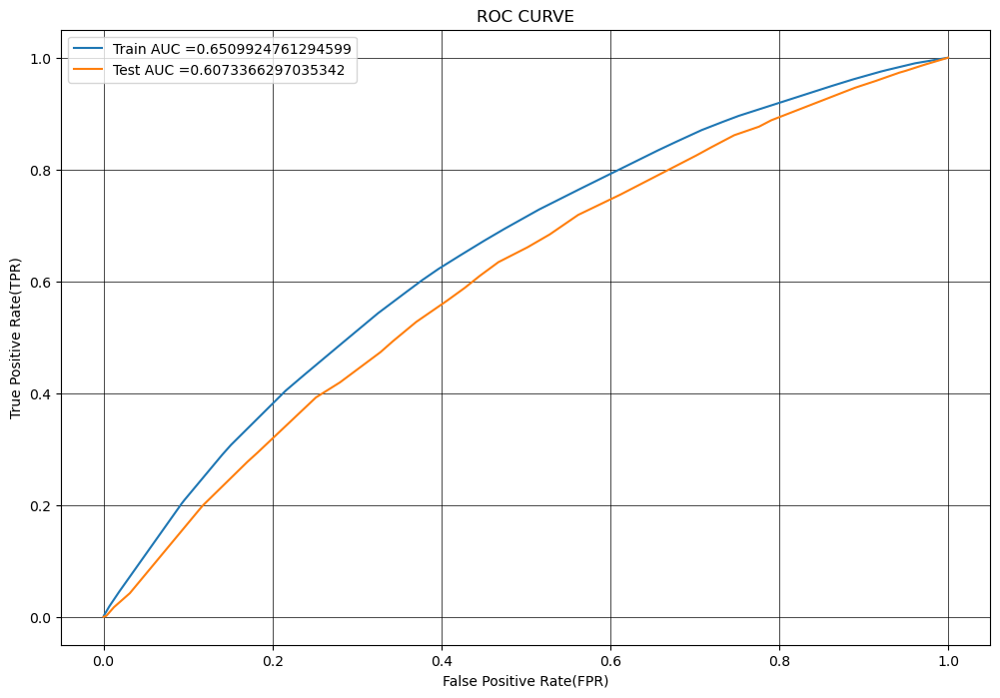

In [105]:
model_set1=DecisionTreeClassifier(class_weight='balanced',max_depth = clf.best_params_["max_depth"],min_samples_split = clf.best_params_["min_samples_split"])
model_set1.fit(X_tr,y_train)
y_train_probs = clf.predict_proba(X_tr)[:,1] # converting train and test output into probability
y_test_probs= clf.predict_proba(X_te )[:,1]

train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, y_train_probs) # storing values of fpr and tpr
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_probs)

plt.figure(figsize=(12,8))
plt.plot(train_fpr, train_tpr, label="Train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="Test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("False Positive Rate(FPR)")
plt.ylabel("True Positive Rate(TPR)")
plt.title("ROC CURVE")
plt.grid(color='black',lw=0.5)

### Confusion Matrix

In [106]:
def find_best_threshold(threshould, fpr, tpr):
    t = threshould[np.argmax(tpr*(1-fpr))]
    # (tpr*(1-fpr)) will be maximum if your fpr is very low and tpr is very high
    print("the maximum value of tpr*(1-fpr)", max(tpr*(1-fpr)), "for threshold", np.round(t,3))
    return t

def predict_with_best_t(proba, threshould):
    predictions = []
    for i in proba:
        if i>=threshould:
            predictions.append(1)
        else:
            predictions.append(0)
    return predictions

#### Train Data

the maximum value of tpr*(1-fpr) 0.37547515746414567 for threshold 0.51
CONFUSION MATRIX OF TRAIN DATA


[[ 4096  2691]
 [14397 23706]]


Text(0.5, 1.0, 'Train Data Confusion Matrix')

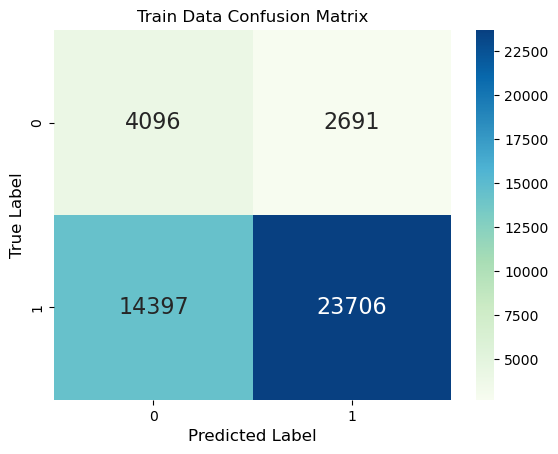

In [107]:
best_t = find_best_threshold(tr_thresholds, train_fpr, train_tpr)
cm=metrics.confusion_matrix(y_train,predict_with_best_t(y_train_probs, best_t))  # https://stackoverflow.com/questions/35572000/how-can-i-plot-a-confusion-matrix

print("CONFUSION MATRIX OF TRAIN DATA")
print("\n")
print(cm)
sns.heatmap(cm, annot=True, fmt='d',cmap='GnBu',annot_kws = {"size":16})
plt.ylabel('True Label',size=12)
plt.xlabel('Predicted Label',size=12)
plt.title('Train Data Confusion Matrix',size=12)

####  Test Data

the maximum value of tpr*(1-fpr) 0.338165856883349 for threshold 0.51
CONFUSION MATRIX OF TEST DATA


[[ 2766  2224]
 [10922 17088]]


Text(0.5, 1.0, 'Test Data Confusion Matrix')

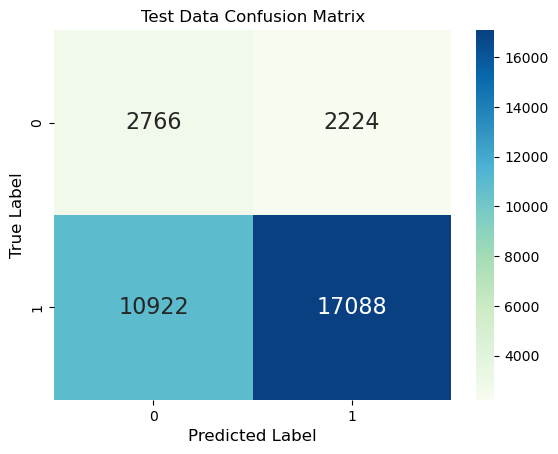

In [108]:
best_t = find_best_threshold(te_thresholds, test_fpr, test_tpr)
cm=metrics.confusion_matrix(y_test,predict_with_best_t(y_test_probs, best_t))
  
print("CONFUSION MATRIX OF TEST DATA")
print('\n')
print(cm)
sns.heatmap(cm, annot=True, fmt='d',cmap='GnBu',annot_kws = {"size":16})
plt.ylabel('True Label',size=12)
plt.xlabel('Predicted Label',size=12)
plt.title('Test Data Confusion Matrix',size=12)

### Getting All the False Positive Data Points

In [109]:
predict=predict_with_best_t(y_test_probs,best_t)

In [110]:
fpi = []
for i in range(len(y_test)):
    if(y_test[i]==0) & (predict[i] == 1): #GETTING THE FALSE POSITIVE INDICES
        fpi.append(i)
len(fpi)

2224

In [111]:
import pandas as pd
cols = X_test.columns
X_test_false_Positive = pd.DataFrame(columns=cols) # MAKING THE FALSE POSITIVE DATAFRAME
X_test_false_Positive=X_test.iloc[fpi]    
print(X_test_false_Positive.shape)   

(2224, 9)


In [112]:
X_test_false_Positive.head(1)

,teacher_prefix,school_state,project_grade_category,project_subject_categories,project_subject_subcategories,project_title,teacher_number_of_previously_posted_projects,essay,price
11041,mrs,fl,grades_prek_2,math_science,mathematics,ipad building brain power full math ahead,0,students need 5 tablets math lessons classroom...,1999.95


#### wordcloud Of Essay Text For False Positive Dataset

In [113]:
from wordcloud import WordCloud, STOPWORDS 
comment_words = ' '
stopwords = set(STOPWORDS)
for word in X_test_false_Positive['essay']:
    val = str(word)                #https://www.geeksforgeeks.org/generating-word-cloud-python/
    tokens = val.split()
    for i in range(len(tokens)):
        tokens[i] = tokens[i].lower()
    for words in tokens:
        comment_words = comment_words + words + ' '

In [114]:
wordcloud = WordCloud(width = 800, height = 800, background_color ='white', stopwords = stopwords, min_font_size = 10).generate(comment_words)

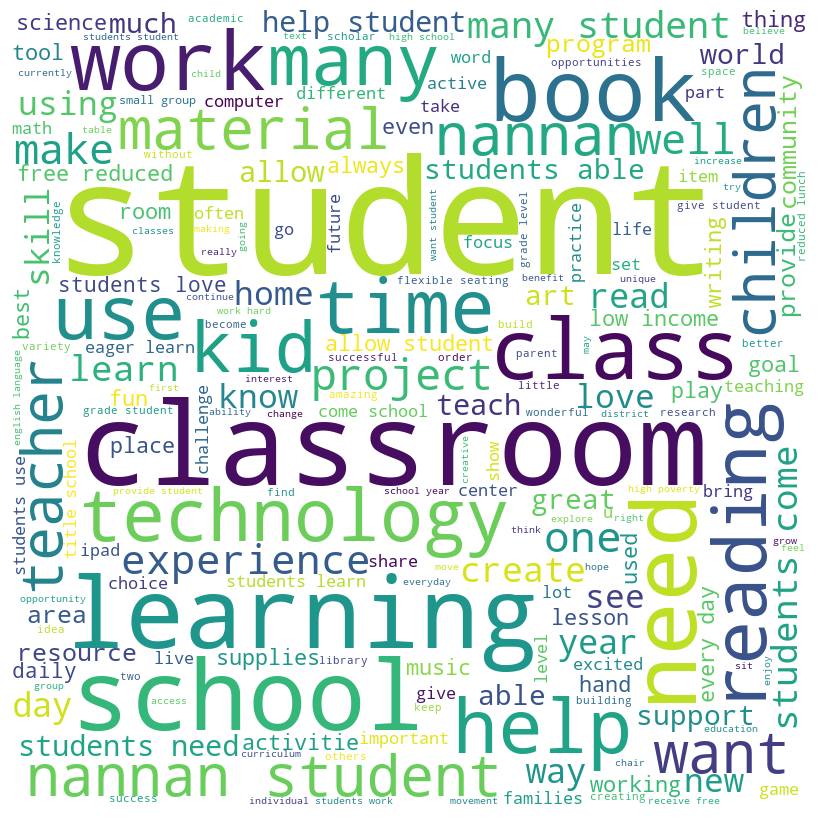

In [115]:
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

#### Box Plot With The Price Of These False Positive Data Points

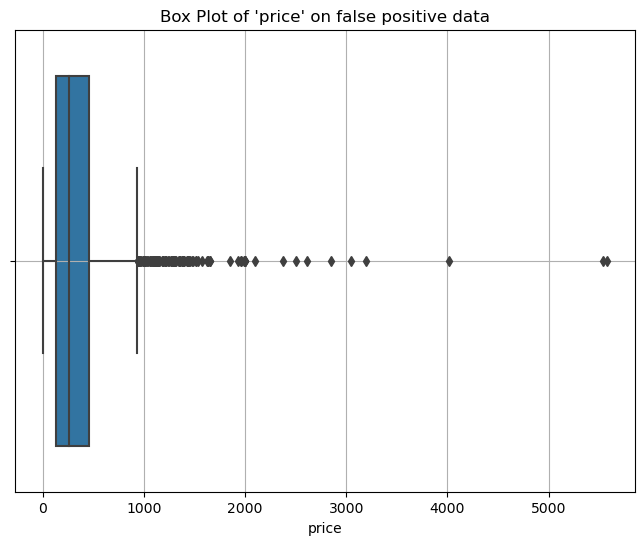

In [116]:
plt.figure(figsize=(8,6))
sns.boxplot('price',data=X_test_false_Positive,orient="v").set_title("Box Plot of 'price' on false positive data")
plt.grid()

#### Pdf Plot With The teacher_number_of_previously_posted_projects Of These False Positive Data Points

[9.20413669e-01 4.63129496e-02 1.16906475e-02 8.99280576e-03
 4.49640288e-03 3.14748201e-03 2.24820144e-03 8.99280576e-04
 8.99280576e-04 8.99280576e-04]
[  0.   21.1  42.2  63.3  84.4 105.5 126.6 147.7 168.8 189.9 211. ]


Text(0.5, 0, 'teacher_number_of_previously_posted_projects')

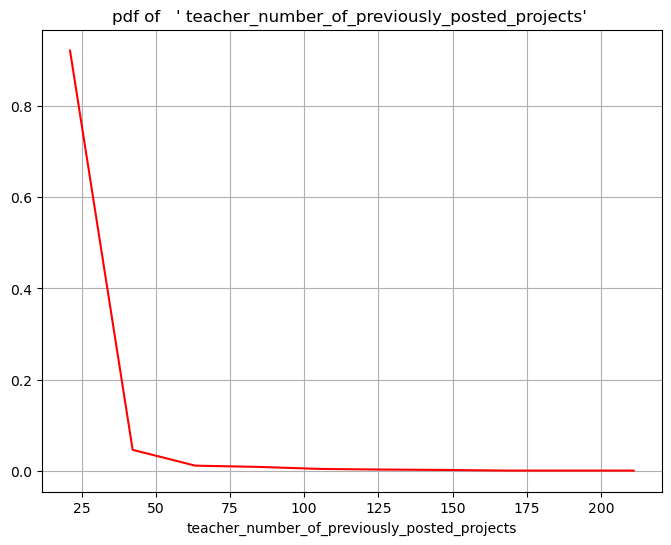

In [117]:
plt.figure(figsize=(8,6))
plt.grid()
counts, bin_edges = np.histogram(X_test_false_Positive['teacher_number_of_previously_posted_projects'], bins=10, 
                                density = True)
pdf = counts/(sum(counts))
print(pdf);
print(bin_edges)
plt.plot(bin_edges[1:],pdf,color="red")
plt.title("pdf of   ' teacher_number_of_previously_posted_projects' ")
plt.xlabel('teacher_number_of_previously_posted_projects')


<h1 align="center"> TASK - 2</h1> 

----------------------------------------------------------------------------------------------------------------------------

###  Selecting All The Features Which Are Having Non-Zero Feature Importance(Set -1)

In [ ]:
# from scipy.sparse import hstack
# X_tr_set_one = hstack((X_train_essay_tfidf, X_train_state_ohe, X_train_teacher_ohe, X_train_grade_ohe, X_train_price_norm,X_train_category_ohe,X_train_subcategory_ohe,X_train_submission_norm,X_train_neg_norm ,X_train_pos_norm,X_train_neu_norm,X_train_compound_norm    )).tocsr()
# X_te_set_one = hstack((X_test_essay_tfidf, X_test_state_ohe, X_test_teacher_ohe, X_test_grade_ohe, X_test_price_norm,X_test_category_ohe,X_test_subcategory_ohe,X_test_submission_norm,X_test_neg_norm.shape,X_test_pos_norm.shape,X_test_neu_norm.shape,X_test_compound_norm.shape)).tocsr()

In [119]:
print("SHAPE OF TRAIN AND TEST AFTER STACKING")
print(X_tr.shape)
print(X_te.shape)

SHAPE OF TRAIN AND TEST AFTER STACKING
(44890, 3917)
(33000, 3917)


In [120]:
clf_fea= DecisionTreeClassifier(class_weight='balanced',max_depth=None,min_samples_split=500) 

In [122]:
clf_fea.fit(X_tr,y_train)

DecisionTreeClassifier(class_weight='balanced', min_samples_split=500)

In [123]:
features = clf_fea.feature_importances_
len(features)

3917

In [124]:
non_zero_features=[]
for i in range(len(features)):
    if features[i]>0:             # FILTERING THE NON ZERO FEATURE IMPORTANT FEATURE INDICES
        non_zero_features.append(i)

In [125]:

print("NUMBER OF NON ZERO IMPORTANT FEATURES =" ,len(non_zero_features))

NUMBER OF NON ZERO IMPORTANT FEATURES = 171


In [127]:
X_tr_fea=X_tr[:,non_zero_features]
X_te_fea=X_te[:,non_zero_features]   # CREATING NON ZERO FEATURE IMPORTANT DATASET

In [128]:
print("SHAPE OF TRAIN AND TEST OF NON ZERO IMPORTANT FEATURES")
print(X_tr_fea.shape)
print(X_te_fea .shape)

SHAPE OF TRAIN AND TEST OF NON ZERO IMPORTANT FEATURES
(44890, 171)
(33000, 171)


In [129]:


tree_parameters = {'max_depth': [1, 5, 10, 50], 
                  'min_samples_split': [5, 10, 100, 500]}

decision_tree= DecisionTreeClassifier(class_weight='balanced') 
clf = GridSearchCV(decision_tree, tree_parameters, cv=5, scoring='roc_auc', return_train_score=True, n_jobs=-1)
clf.fit(X_tr_fea,y_train)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(class_weight='balanced'),
             n_jobs=-1,
             param_grid={'max_depth': [1, 5, 10, 50],
                         'min_samples_split': [5, 10, 100, 500]},
             return_train_score=True, scoring='roc_auc')

In [130]:


train_auc= clf.cv_results_['mean_train_score']
train_auc_std= clf.cv_results_['std_train_score']
cv_auc = clf.cv_results_['mean_test_score'] 
cv_auc_std= clf.cv_results_['std_test_score']

In [131]:
print('Best score: ',clf.best_score_)
print('Best Hyper parameters: ',clf.best_params_)

Best score:  0.6089176765559366
Best Hyper parameters:  {'max_depth': 5, 'min_samples_split': 500}


#### Plotting Hyperparameter v/s Auc

In [132]:
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()

In [133]:
from itertools import repeat
max_depth = [1, 5, 10, 50]
min_samples_split = [5, 10, 100, 500]

x1= max_depth
y1= min_samples_split
z1= train_auc
z2= cv_auc

In [134]:
trace1 = go.Scatter3d(x=x1,y=y1,z=z1, name="train_auc")
trace2 = go.Scatter3d(x=x1,y=y1,z=z2, name="cv_auc")
data = [trace1, trace2]

layout = go.Layout(scene = dict(
        xaxis = dict(title='max_depth'),
        yaxis = dict(title='min_samples_split'),
        zaxis = dict(title='AUC SCORE'),))

fig = go.Figure(data=data, layout=layout)
offline.iplot(fig, filename='3d-scatter-colorscale')

#### Roc Plot Of Train And Test Data

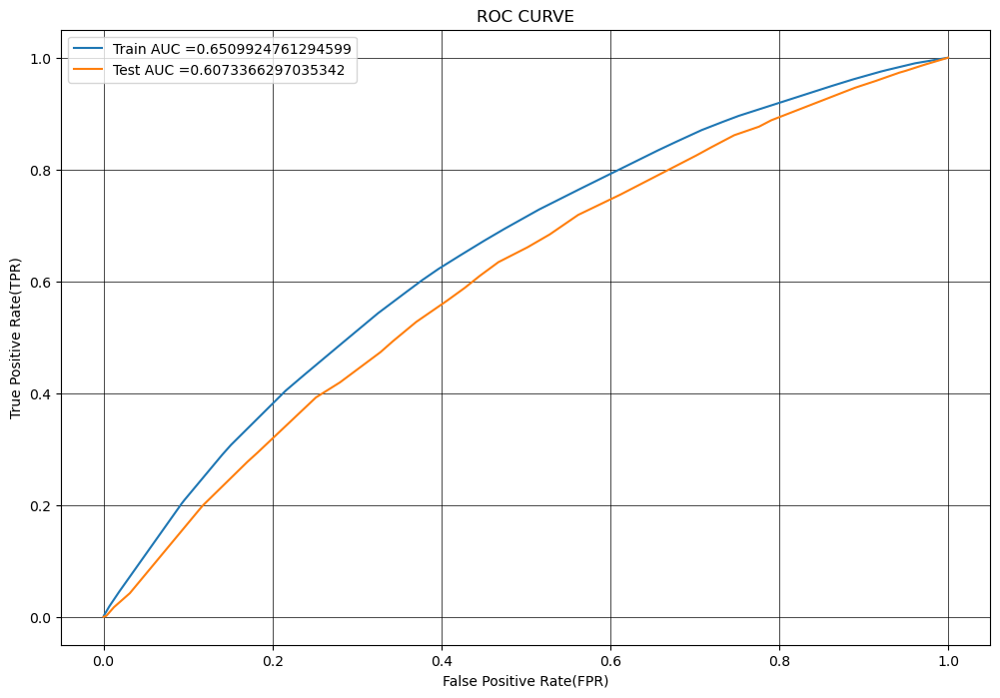

In [135]:
model_set1=DecisionTreeClassifier(class_weight='balanced',max_depth = clf.best_params_["max_depth"],min_samples_split = clf.best_params_["min_samples_split"])
model_set1.fit(X_tr_fea,y_train)
y_train_probs = clf.predict_proba(X_tr_fea)[:,1] # converting train and test output into probability
y_test_probs= clf.predict_proba(X_te_fea )[:,1]

train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, y_train_probs) # storing values of fpr and tpr
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_probs)

plt.figure(figsize=(12,8))
plt.plot(train_fpr, train_tpr, label="Train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="Test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("False Positive Rate(FPR)")
plt.ylabel("True Positive Rate(TPR)")
plt.title("ROC CURVE")
plt.grid(color='black',lw=0.5)

### Confusion Matrix

In [136]:
def find_best_threshold(threshould, fpr, tpr):
    t = threshould[np.argmax(tpr*(1-fpr))]
    # (tpr*(1-fpr)) will be maximum if your fpr is very low and tpr is very high
    print("the maximum value of tpr*(1-fpr)", max(tpr*(1-fpr)), "for threshold", np.round(t,3))
    return t

def predict_with_best_t(proba, threshould):
    predictions = []
    for i in proba:
        if i>=threshould:
            predictions.append(1)
        else:
            predictions.append(0)
    return predictions

#### Train Data

the maximum value of tpr*(1-fpr) 0.37547515746414567 for threshold 0.51
CONFUSION MATRIX OF TRAIN DATA


[[ 4096  2691]
 [14397 23706]]


Text(0.5, 1.0, 'Train Data Confusion Matrix')

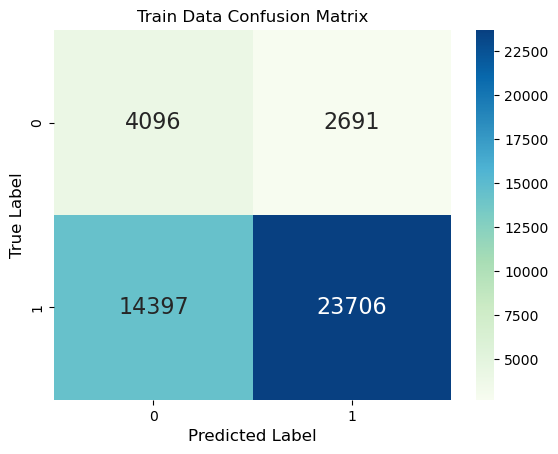

In [137]:
best_t = find_best_threshold(tr_thresholds, train_fpr, train_tpr)
cm=metrics.confusion_matrix(y_train,predict_with_best_t(y_train_probs, best_t))  # https://stackoverflow.com/questions/35572000/how-can-i-plot-a-confusion-matrix

print("CONFUSION MATRIX OF TRAIN DATA")
print("\n")
print(cm)
sns.heatmap(cm, annot=True, fmt='d',cmap='GnBu',annot_kws = {"size":16})
plt.ylabel('True Label',size=12)
plt.xlabel('Predicted Label',size=12)
plt.title('Train Data Confusion Matrix',size=12)

#### Test Data

the maximum value of tpr*(1-fpr) 0.338165856883349 for threshold 0.51
CONFUSION MATRIX OF TEST DATA


[[ 2766  2224]
 [10922 17088]]


Text(0.5, 1.0, 'Test Data Confusion Matrix')

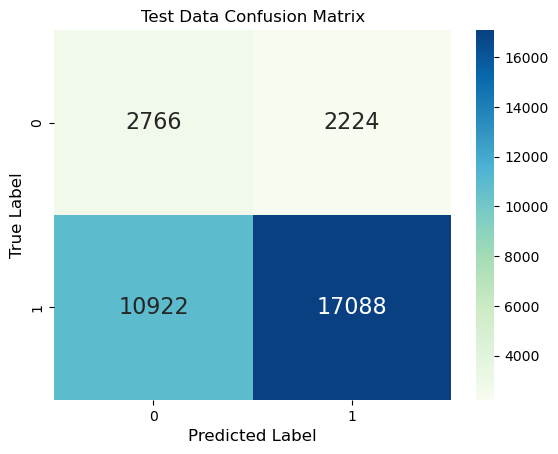

In [138]:
best_t = find_best_threshold(te_thresholds, test_fpr, test_tpr)
cm=metrics.confusion_matrix(y_test,predict_with_best_t(y_test_probs, best_t))
  
print("CONFUSION MATRIX OF TEST DATA")
print('\n')
print(cm)
sns.heatmap(cm, annot=True, fmt='d',cmap='GnBu',annot_kws = {"size":16})
plt.ylabel('True Label',size=12)
plt.xlabel('Predicted Label',size=12)
plt.title('Test Data Confusion Matrix',size=12)

### Getting All the False Positive Data Points

In [139]:
predict=predict_with_best_t(y_test_probs,best_t)

In [140]:
fpi = []
for i in range(len(y_test)):
    if(y_test[i]==0) & (predict[i] == 1):
        fpi.append(i)
len(fpi)

2224

In [141]:
import pandas as pd
cols = X_test.columns
X_test_false_Positive = pd.DataFrame(columns=cols) # MAKING THE FALSE POSITIVE DATAFRAME
X_test_false_Positive=X_test.iloc[fpi]    
print(X_test_false_Positive.shape)   

(2224, 9)


#### wordcloud Of Essay Text For False Positive Dataset

In [142]:
from wordcloud import WordCloud, STOPWORDS 
comment_words = ' '
stopwords = set(STOPWORDS)
for word in X_test_false_Positive['essay']:
    val = str(word)                #https://www.geeksforgeeks.org/generating-word-cloud-python/
    tokens = val.split()
    for i in range(len(tokens)):
        tokens[i] = tokens[i].lower()
    for words in tokens:
        comment_words = comment_words + words + ' '

In [143]:
wordcloud = WordCloud(width = 800, height = 800, background_color ='white', stopwords = stopwords, min_font_size = 10).generate(comment_words)

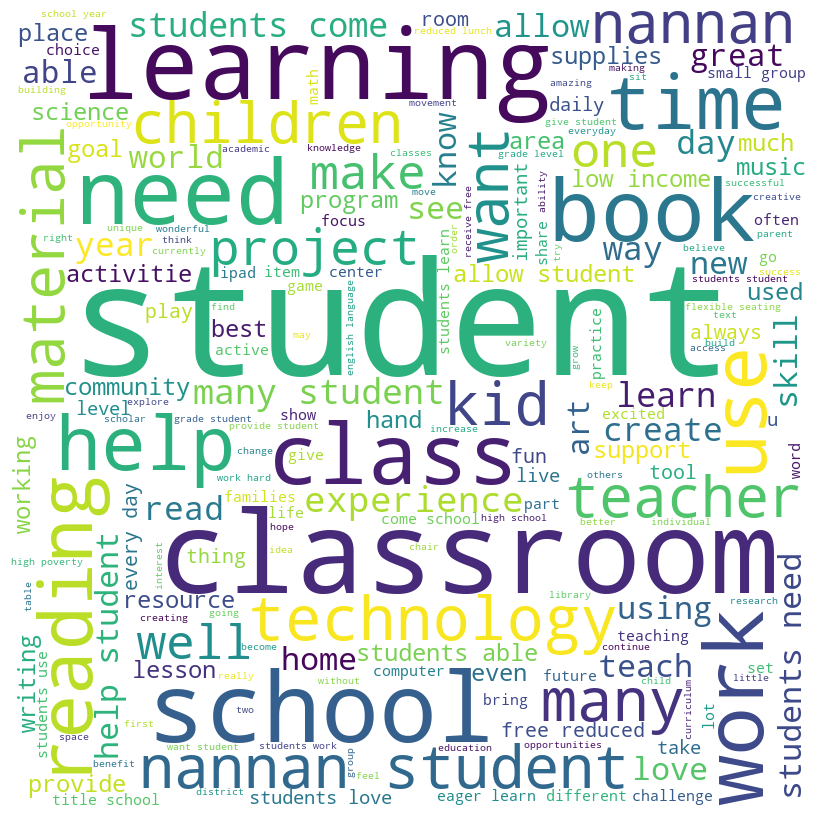

In [144]:
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

#### Box Plot With The Price Of These False Positive Data Points

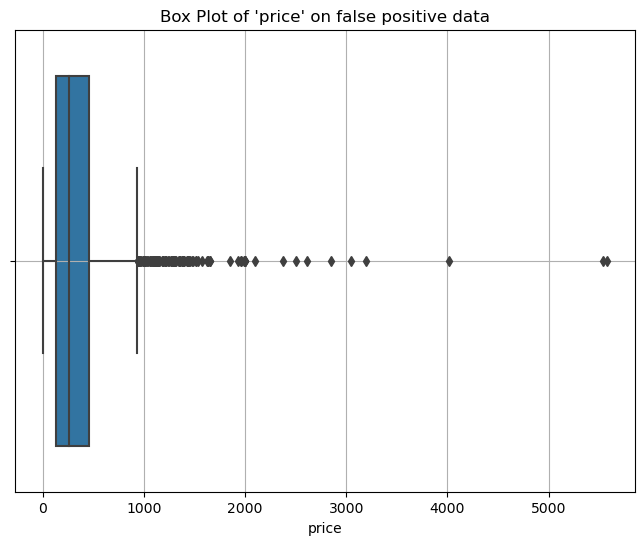

In [145]:
plt.figure(figsize=(8,6))
sns.boxplot('price',data=X_test_false_Positive,orient="v").set_title("Box Plot of 'price' on false positive data")
plt.grid()

#### Pdf Plot With The teacher_number_of_previously_posted_projects Of These False Positive Data Points

[9.20413669e-01 4.63129496e-02 1.16906475e-02 8.99280576e-03
 4.49640288e-03 3.14748201e-03 2.24820144e-03 8.99280576e-04
 8.99280576e-04 8.99280576e-04]
[  0.   21.1  42.2  63.3  84.4 105.5 126.6 147.7 168.8 189.9 211. ]


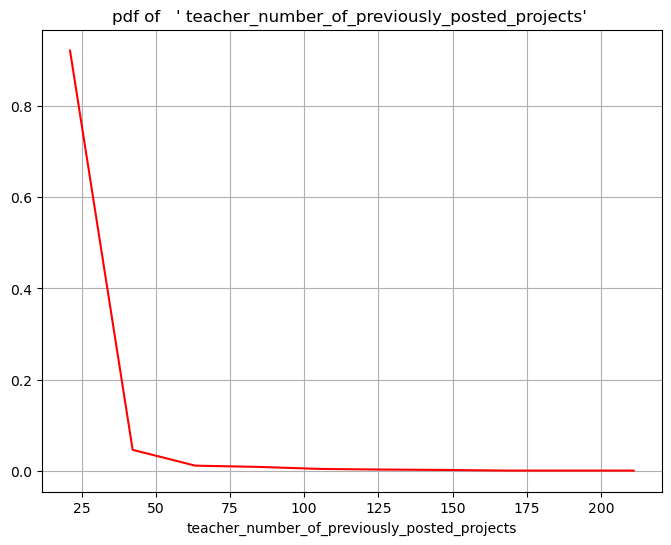

In [147]:
plt.figure(figsize=(8,6))
plt.grid()
counts, bin_edges = np.histogram(X_test_false_Positive['teacher_number_of_previously_posted_projects'], bins=10, 
                                density = True)
pdf = counts/(sum(counts))
print(pdf);
print(bin_edges)
plt.plot(bin_edges[1:],pdf,color="red")
plt.title("pdf of   ' teacher_number_of_previously_posted_projects' ")
plt.xlabel('teacher_number_of_previously_posted_projects');

## Summary

In [148]:
from prettytable import PrettyTable
from prettytable import ALL as ALL
table=PrettyTable(hrules=ALL)
table.field_names = [ "Sl.N0","Vectorizer", "Model", "Hyper Parameter", "Test-AUC"] # # http://zetcode.com/python/prettytable/
table.add_row([1,"TFIDF", "DECSION TREE", "max_depth =10 , min_samples_split=500", 0.65042])
table.add_row([2,"TFIDF W2V", "DECSION TREE"," max_depth =5 , min_samples_split=500", 0.56212])
table.add_row([3,"TFIDF NON ZERO FEATURE IMPORTANCE", "DECSION TREE", "max_depth =10 , min_samples_split=500", 0.650380])
print(table)

+-------+-----------------------------------+--------------+---------------------------------------+----------+
| Sl.N0 |             Vectorizer            |    Model     |            Hyper Parameter            | Test-AUC |
+-------+-----------------------------------+--------------+---------------------------------------+----------+
|   1   |               TFIDF               | DECSION TREE | max_depth =10 , min_samples_split=500 | 0.65042  |
+-------+-----------------------------------+--------------+---------------------------------------+----------+
|   2   |             TFIDF W2V             | DECSION TREE |  max_depth =5 , min_samples_split=500 | 0.56212  |
+-------+-----------------------------------+--------------+---------------------------------------+----------+
|   3   | TFIDF NON ZERO FEATURE IMPORTANCE | DECSION TREE | max_depth =10 , min_samples_split=500 | 0.65038  |
+-------+-----------------------------------+--------------+---------------------------------------+----